<a href="https://colab.research.google.com/github/Claptar/spatialMPFC/blob/main/Fanctional_analysis/pseudobulk/EdgeR_Functional_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [ ]:
!pip install scanpy[leiden] anndata2ri scikit-misc scvi-tools squidpy gseapy sc-toolbox decoupler --quiet

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

## Imports

In [1]:
import warnings
import scanpy as sc
import gseapy
import decoupler
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

Creating directory /root/.config/bioservices 


# Global variables

Нужно подключить свой гугл диск

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
dir_path = 'drive/MyDrive/Spatial project/results/'

In [4]:
de_dir_path = 'drive/MyDrive/Spatial project/results/DE/young_vs_old_scanpy/'

In [5]:
os.listdir(de_dir_path)

['edgeR', 'scanpy']

### DE results

In [6]:
# Load EdgeR results
edgeR_DE = dict()

for file in os.listdir(de_dir_path + 'edgeR'):
    layer = file.split('_')[0]
    df = pd.read_csv(de_dir_path + 'edgeR/' + file, index_col=0)
    # remove mito hb and rb genes
    mito = df.index.str.startswith('MT-')
    hb = df.index.str.contains(("^HB[AB]"))
    rb = df.index.str.contains(("^RP[LS]"))
    remove = mito | hb | rb
    df = df.loc[~remove]
    
    edgeR_DE[layer] = df

edgeR_DE.keys()

dict_keys(['WM', 'L5', 'L2', 'L3', 'L1', 'L6', 'L4'])

In [7]:
edgeR_DE['L1']

,logFC,logCPM,F,PValue,FDR
NLRP1,-12.290117,7.616894,8.849669e+02,4.300965e-52,5.082880e-48
DPYSL3,3.618613,8.494822,6.061350e+02,1.164502e-45,6.881043e-42
VXN,-11.139452,6.644319,5.611696e+02,2.859678e-43,1.126522e-39
YBX1,3.958872,8.784563,5.298523e+02,4.782240e-43,1.412913e-39
TUBA1A,3.208877,11.739539,4.999432e+02,6.182635e-42,1.461328e-38
...,...,...,...,...,...
HUS1,0.000509,3.249055,1.254909e-06,9.991083e-01,9.992944e-01
TUBGCP2,0.013668,5.847461,9.082083e-03,9.991178e-01,9.992944e-01
UBE2G2,0.000170,5.152333,9.525497e-07,9.992231e-01,9.992944e-01
PGS1,0.059686,4.460213,7.521595e-02,9.992876e-01,9.992944e-01


### Load adata

In [8]:
# read young human adata object
human_young = sc.read_h5ad(dir_path + 'filtered_samples/human.h5ad')
print(human_young)

# add _young sufix to layer name
human_young.obs.label.replace({"L6a": "L6", "L6b": "L6"}, inplace=True)
human_young.obs.label = human_young.obs.label.astype('str') + '_young'

AnnData object with n_obs × n_vars = 15417 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
# read young human adata object
human_old = sc.read_h5ad(dir_path + 'filtered_samples/spatial_libd_human.h5ad')
print(human_old)

# add _young sufix to layer name
human_old.obs.label = human_old.obs.label.astype('str') + '_old'

AnnData object with n_obs × n_vars = 42588 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_mt_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
# concat old and young files
adata = an.concat([human_young, human_old], merge='same',uns_merge="unique")
adata.obs_names_make_unique()
adata

/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 58005 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors'
    obsm: 'spatial'

In [11]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759',
 'human_j12',
 'human_j3',
 'human_j4',
 'human_j6',
 '151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676']

In [12]:
del human_young, human_old

### Load pseudobulks

In [13]:
de_dir_path = 'drive/MyDrive/Spatial project/results/DE/pseudobulks/'

In [14]:
os.listdir(de_dir_path)

['expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_mean_chimp.csv',
 'annotation_chimp.csv',
 'expression_sum_human.csv',
 'expression_mean_human.csv',
 'annotation_human.csv',
 'expression_sum_macaque.csv',
 'expression_mean_macaque.csv',
 'annotation_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'expression_mean_spatial_libd_human.csv',
 'annotation_spatial_libd_human.csv']

In [15]:
adata_pb_list = list()
aggregate_method = 'mean'

for library in ['human', 'spatial_libd_human']:
    exp_file_name = '_'.join(['expression', aggregate_method, library]) + '.csv'
    ann_file_name = '_'.join(['annotation', library]) + '.csv'
    expr_file = pd.read_csv(de_dir_path + exp_file_name, index_col=0)
    ann_file = pd.read_csv(de_dir_path + ann_file_name, index_col=0)
    adata_pb = an.AnnData(expr_file.T, obs=ann_file)
    adata_pb_list.append(adata_pb)

In [16]:
adata_pb = an.concat(adata_pb_list, merge='same')
adata_pb

AnnData object with n_obs × n_vars = 111 × 19404
    obs: 'layer', 'sample_id', 'condition'

### Preprocess pseudobulk

In [17]:
# preprocess
adata_pb.raw = adata_pb
sc.pp.normalize_total(adata_pb, target_sum=1e4)
sc.pp.log1p(adata_pb)
sc.pp.pca(adata_pb)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)


In [18]:
adata_pb.obs.sample_id = adata_pb.obs.sample_id.astype('category')
adata_pb.obs['label'] = adata_pb.obs.layer.astype(str)  + adata_pb.obs.condition.astype(str).replace({"human": '_young', "spatial_libd_human": '_old'})

In [19]:
sc.pp.highly_variable_genes(
    adata=adata_pb, flavor="seurat", 
    n_top_genes=4000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [20]:
mito = adata_pb.var_names.str.startswith('MT-')
hb = adata_pb.var_names.str.contains(("^HB[AB]"))
rb = adata_pb.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = adata_pb.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

adata_pb = adata_pb[:,keep]
highly_variable_genes_pb = adata_pb.var[adata_pb.var.highly_variable].index.tolist()

117


### Add diff. expr. results to adata

In [21]:
from sc_toolbox.tools import de_res_to_anndata

for layer in edgeR_DE.keys():
    label = layer + '_young'
    df = edgeR_DE[layer]
    df["gene_symbol"] = df.index
    df["label"] = label


    de_res_to_anndata(
            adata,
            df,
            groupby="label",
            score_col="logCPM",
            pval_col="PValue",
            pval_adj_col="FDR",
            lfc_col="logFC",
            key_added="edgeR_" + label,
        )

In [22]:
from sc_toolbox.tools import de_res_to_anndata

for layer in edgeR_DE.keys():
    label = layer + '_young'
    df = edgeR_DE[layer]
    df["gene_symbol"] = df.index
    df["label"] = label


    de_res_to_anndata(
            adata_pb,
            df,
            groupby="label",
            score_col="logCPM",
            pval_col="PValue",
            pval_adj_col="FDR",
            lfc_col="logFC",
            key_added="edgeR_" + label,
        )

/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


### Preprocess

In [23]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [24]:
sc.pp.highly_variable_genes(
    adata=adata, flavor="seurat", 
    n_top_genes=4000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:25)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [25]:
sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:37)


In [26]:
mito = adata.var_names.str.startswith('MT-')
hb = adata.var_names.str.contains(("^HB[AB]"))
rb = adata.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = adata.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

de_adata = adata[:,keep]
highly_variable_genes = adata.var[adata.var.highly_variable].index.tolist()

117


# Результаты дифф. экспрессии

In [27]:
def sign_de(de_results):
    sign_dict = dict()
    
    for layer, df in de_results.items():
        sign_dict[layer] = df[df.PValue < 0.05]
    return sign_dict

In [28]:
edgeR_sign = sign_de(edgeR_DE)

In [29]:
common_degenes = edgeR_sign['L1'].index & edgeR_sign['L2'].index & edgeR_sign['L3'].index &\
                 edgeR_sign['L4'].index & edgeR_sign['L5'].index & edgeR_sign['L6'].index & edgeR_sign['WM'].index
common_degenes

Index(['NLRP1', 'DPYSL3', 'VXN', 'YBX1', 'TUBA1A', 'STMN2', 'PTP4A1', 'CXADR',
       'IDS', 'KCNAB2',
       ...
       'PLK3', 'AP3M1', 'OMG', 'ABCC5', 'SLC35A1', 'PREX2', 'ATF3', 'SMARCA2',
       'SDR39U1', 'SENP1'],
      dtype='object', length=4396)

### Отберем гены, которые являются дифф. экспр. во всех слоях и встречаются в более чем половине спотов образцов

In [30]:
def calculate_pct_group(adata, group):
    for value in adata.obs[group].unique():
        mask = (adata.obs[group] == value)
        value_pct = adata[mask].X.getnnz(axis=0) / adata[mask].X.shape[0]
        adata.var["pct_" + value] = value_pct

In [31]:
calculate_pct_group(adata, 'sample_id')
calculate_pct_group(adata, 'label')
adata.var.head()

,feature_types,mt,hb,ribo,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,...,pct_L1_young,pct_L6_young,pct_L4_young,pct_L1_old,pct_L3_old,pct_WM_old,pct_L6_old,pct_L5_old,pct_L2_old,pct_L4_old
OR4F5,Gene Expression,False,False,False,False,0.000000,0.000000,0.000000,0,False,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F29,Gene Expression,False,False,False,False,0.000000,0.000000,0.000000,0,False,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F16,Gene Expression,False,False,False,False,0.000000,0.000000,0.000000,0,False,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SAMD11,Gene Expression,False,False,False,True,0.018350,1.512745,0.794882,11,False,...,0.012186,0.003392,0.007692,0.006058,0.004150,0.013336,0.006702,0.005294,0.002559,0.004961
NOC2L,Gene Expression,False,False,False,False,0.379769,1.275595,-0.590589,0,False,...,0.123382,0.254381,0.458242,0.061662,0.145442,0.095884,0.150302,0.178996,0.144424,0.167442


In [32]:
common_hv_genes = set(highly_variable_genes) & set(common_degenes)
len(common_hv_genes)

1085

In [33]:
columns = adata.var.columns
sample_id_pct_columns = columns[(columns.str.contains("pct")) & (~columns.str.contains("L"))]
layer_pct_columns = columns[columns.str.contains("L")]

In [34]:
mask = (adata.var[sample_id_pct_columns].min(axis=1) > 0.1)
common_highpct_genes = adata.var.loc[common_degenes][mask].index
common_highpct_genes

<ipython-input-34-33c0e496f983>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  common_highpct_genes = adata.var.loc[common_degenes][mask].index


Index(['YBX1', 'TUBA1A', 'STMN2', 'STMN1', 'TUBB2B', 'NNAT', 'TUBB', 'CA11',
       'CKB', 'CRMP1',
       ...
       'ESD', 'WIPI2', 'NDRG1', 'DDB1', 'LIMCH1', 'PTPRF', 'HMGA1', 'OLIG1',
       'OMG', 'SMARCA2'],
      dtype='object', length=843)

In [35]:
de_df = edgeR_sign['L1']
upreg_genes = de_df.loc[common_highpct_genes][de_df.logFC > 0].index.tolist()
dwreg_genes = de_df.loc[common_highpct_genes][de_df.logFC < 0].index.tolist()
print(f'upreg: {len(upreg_genes)}')
print(f'dwreg: {len(dwreg_genes)}')

upreg: 420
dwreg: 423


<ipython-input-35-c3fa17a81de7>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  upreg_genes = de_df.loc[common_highpct_genes][de_df.logFC > 0].index.tolist()
<ipython-input-35-c3fa17a81de7>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dwreg_genes = de_df.loc[common_highpct_genes][de_df.logFC < 0].index.tolist()


# GSA

In [36]:
gene_set_names = gseapy.get_library_name(organism='Human')
gene_set_names[:5]
#gene_set_names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues']

## Возьмём базу данных `Reactome_2022`

### Upregulated

In [37]:
enr_res_up = gseapy.enrichr(gene_list=upreg_genes,
                     organism='Human',
                     gene_sets='Reactome_2022')

In [38]:
enr_res_up.res2d.Term = enr_res_up.res2d.Term

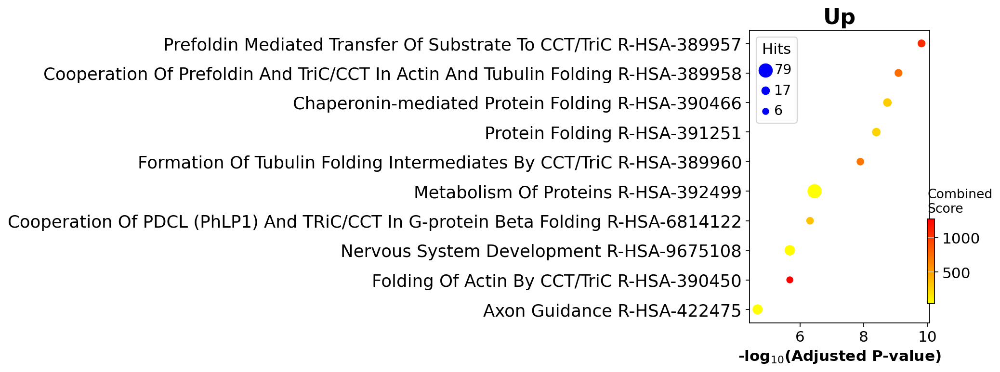

In [39]:
gseapy.dotplot(enr_res_up.res2d, figsize=(3,5), title="Up", cmap = plt.cm.autumn_r)
plt.show()

In [40]:
enr_res_up.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_REACTOME_upreg.csv')

### Downregulated

In [41]:
enr_res_dw = gseapy.enrichr(gene_list=dwreg_genes,
                     organism='Human',
                     gene_sets='Reactome_2022')

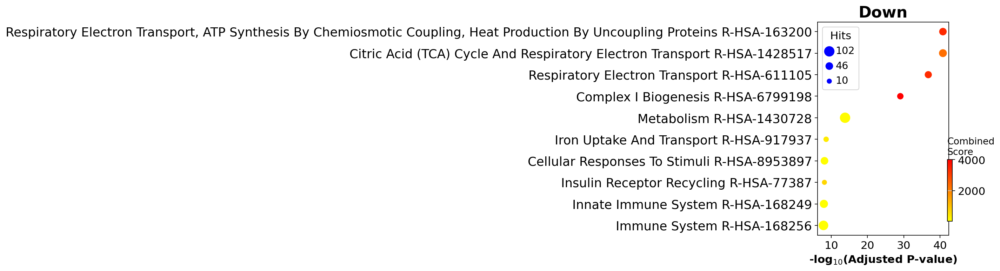

In [42]:
gseapy.dotplot(enr_res_dw.res2d, figsize=(3,5), title="Down", cmap = plt.cm.autumn_r)
plt.show()

In [43]:
enr_res_dw.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_REACTOME_dwreg.csv')

### Combined

In [44]:
enr_res_up.res2d['UP_DW'] = "UP"
enr_res_dw.res2d['UP_DW'] = "DOWN"
enr_res = pd.concat([enr_res_up.res2d.head(10), enr_res_dw.res2d.head(10)])

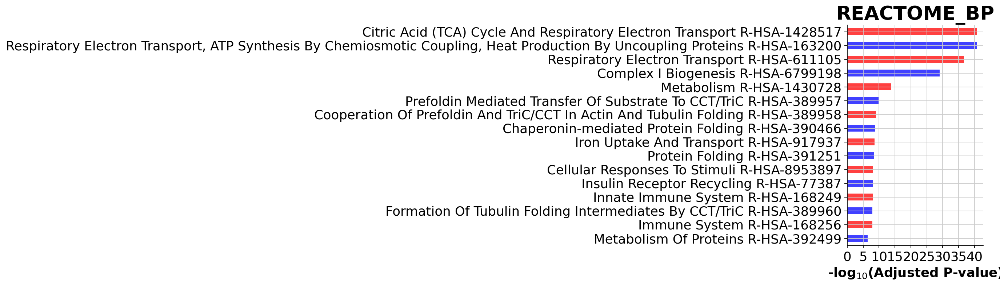

In [45]:
ax = gseapy.barplot(enr_res, figsize=(3,5),
                group ='UP_DW',
                title ="REACTOME_BP",
                color = ['b','r'],
                top_term=16)

## Возьмём базу данных `GO_Biological_Process_2021`

### Upregulated

In [46]:
enr_res_up = gseapy.enrichr(gene_list=upreg_genes,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2021')

In [47]:
enr_res_up.res2d.Term = enr_res_up.res2d.Term.str.split(" \(GO").str[0]

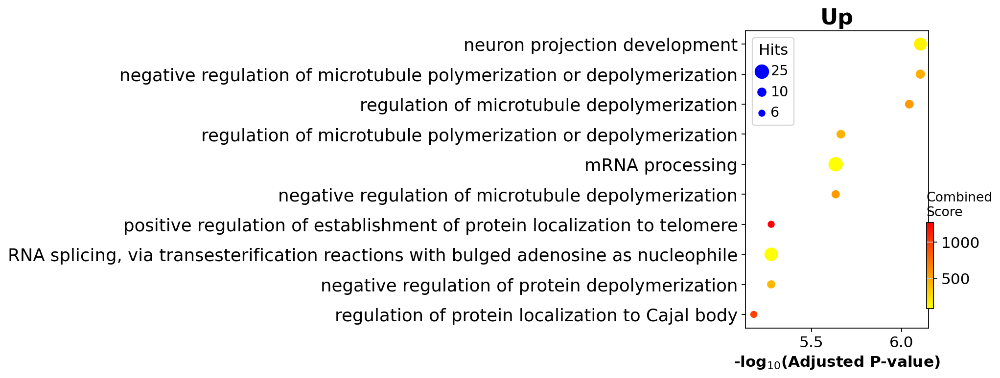

In [48]:
gseapy.dotplot(enr_res_up.res2d, figsize=(3,5), title="Up", cmap = plt.cm.autumn_r)
plt.show()

In [49]:
enr_res_up.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_GO_upreg.csv')

### Downregulated

In [50]:
enr_res_dw = gseapy.enrichr(gene_list=dwreg_genes,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2021')

In [51]:
enr_res_dw.res2d.Term = enr_res_dw.res2d.Term.str.split(" \(GO").str[0]

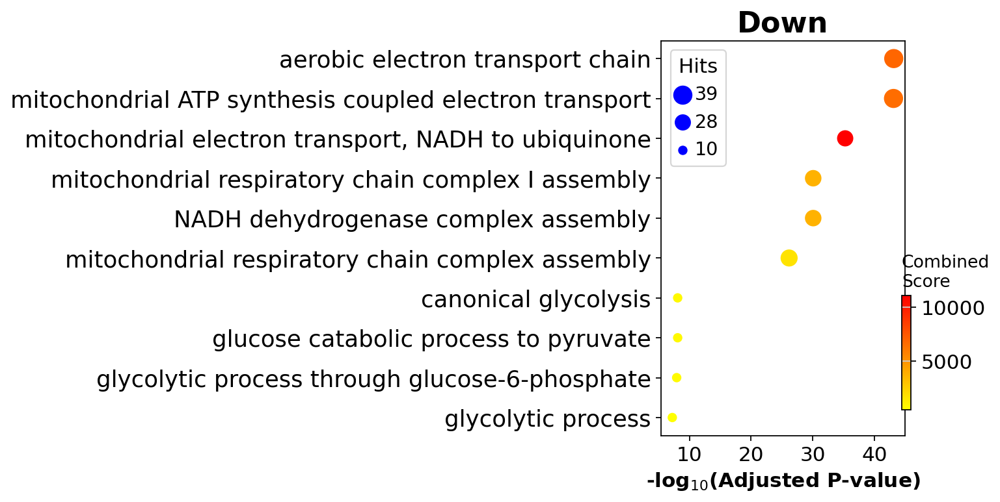

In [52]:
gseapy.dotplot(enr_res_dw.res2d, figsize=(3,5), title="Down", cmap = plt.cm.autumn_r)
plt.show()

In [53]:
enr_res_dw.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_GO_dwreg.csv')

### Combined

In [54]:
enr_res_up.res2d['UP_DW'] = "UP"
enr_res_dw.res2d['UP_DW'] = "DOWN"
enr_res = pd.concat([enr_res_up.res2d.head(10), enr_res_dw.res2d.head(10)])

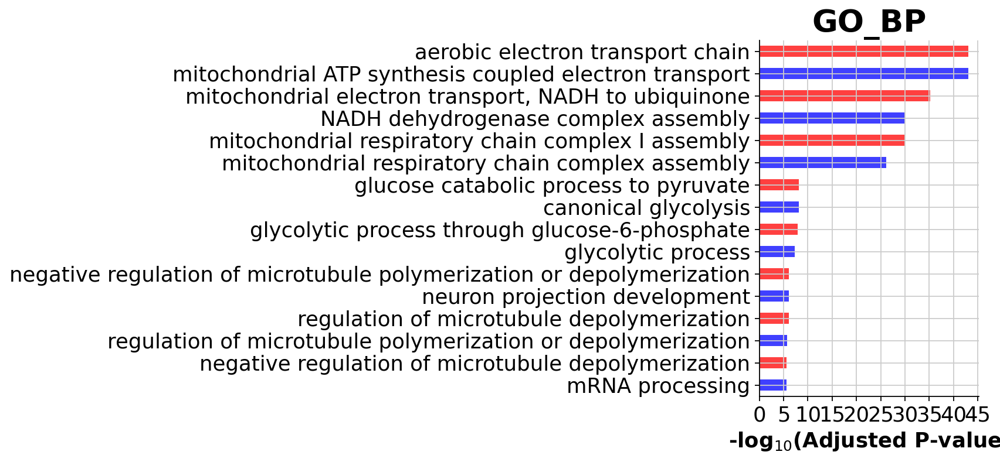

In [55]:
ax = gseapy.barplot(enr_res, figsize=(3,5),
                group ='UP_DW',
                title ="GO_BP",
                color = ['b','r'],
                top_term=16)

## Возьмём базу данных `MGI_Mammalian_Phenotype_Level_4_2021`

### Upregulated

In [56]:
enr_res_up = gseapy.enrichr(gene_list=upreg_genes,
                     organism='Human',
                     gene_sets='MGI_Mammalian_Phenotype_Level_4_2021')

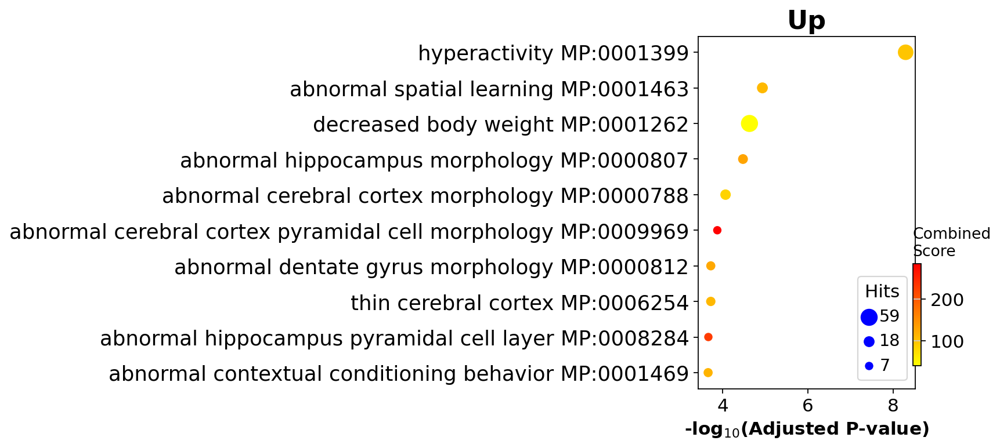

In [57]:
gseapy.dotplot(enr_res_up.res2d, figsize=(3,5), title="Up", cmap = plt.cm.autumn_r)
plt.show()

In [58]:
enr_res_up.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_MGI_Mammalian_Phenotype_Level_4_2021_upreg.csv')

### Downregulated

In [59]:
enr_res_dw = gseapy.enrichr(gene_list=dwreg_genes,
                     organism='Human',
                     gene_sets='MGI_Mammalian_Phenotype_Level_4_2021')

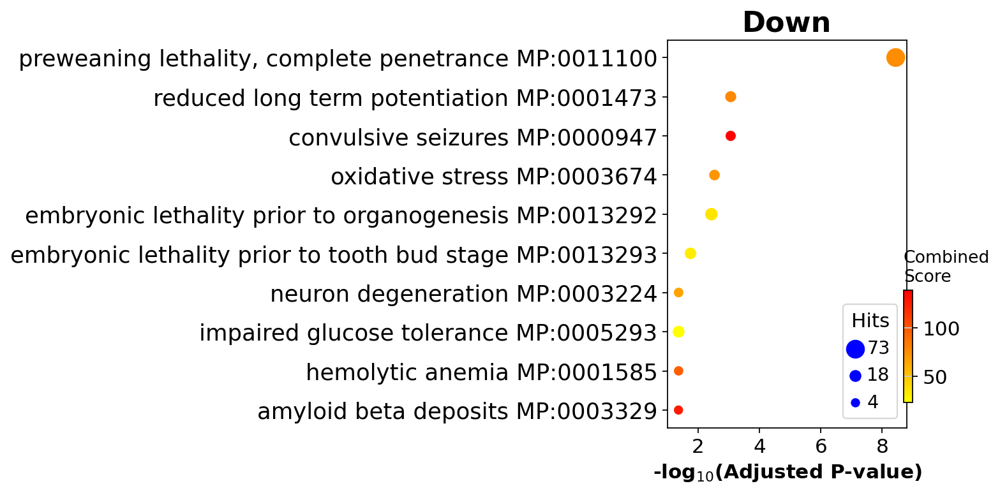

In [60]:
gseapy.dotplot(enr_res_dw.res2d, figsize=(3,5), title="Down", cmap = plt.cm.autumn_r)
plt.show()

In [61]:
enr_res_dw.res2d.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSA_MGI_Mammalian_Phenotype_Level_4_2021_dwreg.csv')

### Combined

In [62]:
enr_res_up.res2d['UP_DW'] = "UP"
enr_res_dw.res2d['UP_DW'] = "DOWN"
enr_res = pd.concat([enr_res_up.res2d.head(10), enr_res_dw.res2d.head(10)])

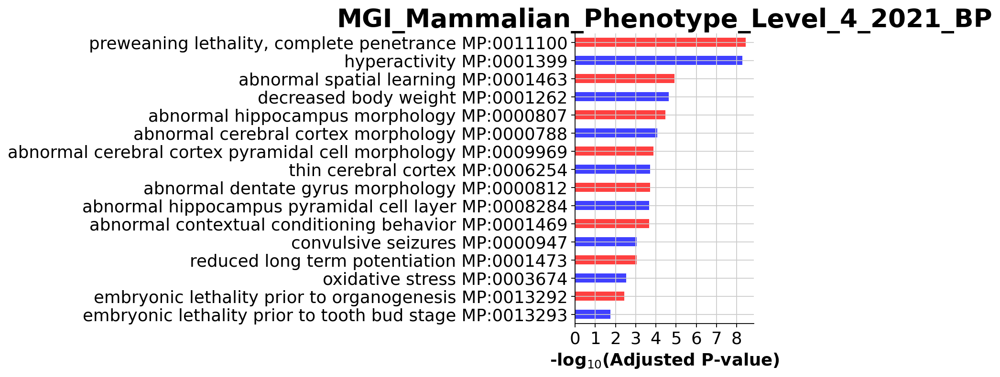

In [63]:
ax = gseapy.barplot(enr_res, figsize=(3,5),
                group ='UP_DW',
                title ="MGI_Mammalian_Phenotype_Level_4_2021_BP",
                color = ['b','r'],
                top_term=16)

# GSEA

## GO_Biological_Process_2021

In [64]:
layer = 'L3'
genes_by_fc = edgeR_sign[layer].sort_values(by='logFC', ascending=False).index.tolist()

In [65]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/addList'
genes_str = '\n'.join(genes_by_fc)
description = 'L1 gene list'
payload = {
    'list': (None, genes_str),
    'description': (None, description)
}

response = requests.post(ENRICHR_URL, files=payload)
if not response.ok:
    raise Exception('Error analyzing gene list')

data = json.loads(response.text)
print(data)

{'shortId': '6de474093b33ed908f14d64074afd26c', 'userListId': 60475552}


In [66]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/enrich'
query_string = '?userListId=%s&backgroundType=%s'
user_list_id = 60475237
gene_set_library = 'GO_Biological_Process_2021'
response = requests.get(
    ENRICHR_URL + query_string % (user_list_id, gene_set_library)
 )
if not response.ok:
    raise Exception('Error fetching enrichment results')

data = json.loads(response.text)
print(data)

{'GO_Biological_Process_2021': [[1, 'cellular protein modification process (GO:0006464)', 3.00693073897853e-21, 1.833454524715913, 86.63689968528224, ['GMFB', 'PGAP1', 'MAML1', 'GMFG', 'ARAF', 'DCAF8', 'DCAF5', 'DCAF7', 'DCAF6', 'NAA80', 'PSMD8', 'LIPE', 'PSMD9', 'NUB1', 'PPP4R1', 'PSMD7', 'PSMD4', 'AKT3', 'AKT1', 'PRKACA', 'CHGB', 'PRKCG', 'WSB1', 'CSNK2A1', 'WSB2', 'DAPK1', 'PRKCB', 'DAPK2', 'PRKCE', 'DAPK3', 'PRKCD', 'ATG10', 'PRKCA', 'PASK', 'PRKAR1B', 'PSME1', 'PSME2', 'SPARCL1', 'PRKD1', 'ALG10B', 'UBA52', 'MTMR3', 'RPN2', 'CTBP1', 'PRKDC', 'RPN1', 'COPS7A', 'ZC3HAV1', 'MTMR4', 'HIF1A', 'MTMR6', 'MTMR7', 'C3', 'HLCS', 'ST3GAL5', 'PSMF1', 'ATG7', 'ST3GAL1', 'ST3GAL2', 'LHPP', 'B3GALNT2', 'PRRT1', 'CDK17', 'B3GALNT1', 'CDK18', 'CDK19', 'ICMT', 'DMPK', 'PLK2', 'EIF2AK2', 'ABCA7', 'BRAF', 'EIF2AK4', 'FAM220A', 'MEX3B', 'PPP5C', 'GALNTL5', 'CDK13', 'CDK14', 'RET', 'ARF4', 'PIGU', 'PIGT', 'SETD3', 'HIF3A', 'WDR45', 'PRSS23', 'TRIOBP', 'DDA1', 'IKBKB', 'UBL5', 'B3GALT2', 'TIMP1', 'JAK2'

In [67]:
columns = ['Rank', 'Term', 'p-val', 'Z-score', 'Combined score', 'Overlapping genes', 'Adjusted P-value', 'Old p-value', 'Old adjusted p-value']
results = pd.DataFrame(data['GO_Biological_Process_2021'], columns=columns)
results.Term = results.Term.astype(str)
results.set_index('Rank')
results.head(3)

,Rank,Term,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value
0,1,cellular protein modification process (GO:0006...,3.006931e-21,1.833455,86.636900,"[GMFB, PGAP1, MAML1, GMFG, ARAF, DCAF8, DCAF5,...",1.786418e-17,0,0
1,2,"negative regulation of transcription, DNA-temp...",1.580195e-13,1.629391,48.028021,"[ZNF175, SPI1, MYT1L, EHMT2, EHMT1, HNRNPU, EN...",4.693970e-10,0,0
2,3,"mRNA splicing, via spliceosome (GO:0000398)",2.974698e-13,2.448826,70.632623,"[DBR1, GEMIN2, EIF4A3, GPATCH1, HNRNPU, HNRNPR...",5.890894e-10,0,0


<Axes: xlabel='Adjusted P-value', ylabel='Term'>

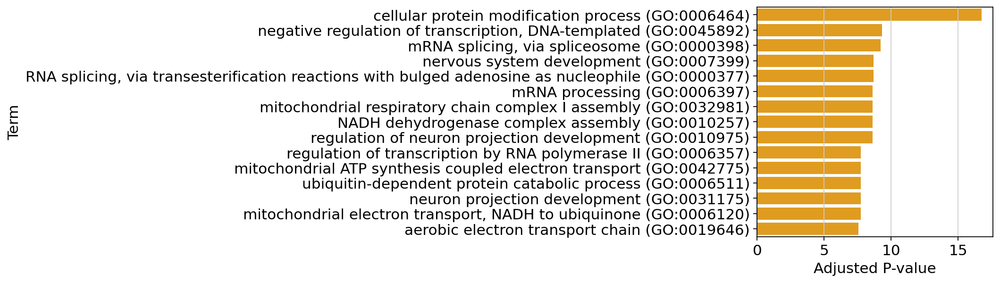

In [68]:
n_top = 15
sns.barplot(data=results.iloc[:n_top], x=-np.log10(results['Adjusted P-value']), y='Term', color='orange')

In [69]:
results.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSEA_GO_Biological_Process_2021.csv')

## Reactome_2022

In [70]:
layer = 'L3'
genes_by_fc = edgeR_sign[layer].sort_values(by='logFC', ascending=False).index.tolist()

In [71]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/addList'
genes_str = '\n'.join(genes_by_fc)
description = 'L1 gene list'
payload = {
    'list': (None, genes_str),
    'description': (None, description)
}

response = requests.post(ENRICHR_URL, files=payload)
if not response.ok:
    raise Exception('Error analyzing gene list')

data = json.loads(response.text)
print(data)

{'shortId': '21275615ebcbaed098805693654e8cda', 'userListId': 60475556}


In [72]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/enrich'
query_string = '?userListId=%s&backgroundType=%s'
user_list_id = 60475250
gene_set_library = 'Reactome_2022'
response = requests.get(
    ENRICHR_URL + query_string % (user_list_id, gene_set_library)
 )
if not response.ok:
    raise Exception('Error fetching enrichment results')

data = json.loads(response.text)
print(data)

{'Reactome_2022': [[1, 'Gene Expression (Transcription) R-HSA-74160', 2.3022339829066552e-23, 1.720271022603416, 89.6701199771496, ['TDRKH', 'NUP107', 'SPI1', 'EHMT2', 'EHMT1', 'PSMD8', 'PSMD9', 'LSM11', 'PSMD7', 'PSMD4', 'AKT3', 'AKT1', 'MTERF1', 'ZNF287', 'DAXX', 'MEF2C', 'PRKAB2', 'RBFOX1', 'SAP30BP', 'ZNF282', 'ZNF10', 'DICER1', 'ZNF14', 'CLDN5', 'SCO2', 'DDIT3', 'DDIT4', 'PSME1', 'PSME2', 'TXNIP', 'MYL9', 'ZNF28', 'SLBP', 'ZNF274', 'GATA3', 'ZNF25', 'ZNF26', 'GRIN2A', 'PSMF1', 'ATRIP', 'PPARGC1A', 'ZNF268', 'PPARGC1B', 'PRELID3A', 'ZNF266', 'CREBBP', 'ZNF263', 'JAG1', 'NR2F1', 'ZNF34', 'MAGOHB', 'GRIN2B', 'NR2F6', 'COL1A1', 'MOV10', 'COL1A2', 'AGO3', 'AGO4', 'ZNF30', 'ZNF254', 'ZNF253', 'ZNF493', 'ZNF250', 'ZNF43', 'ZNF45', 'BBC3', 'MED17', 'MECP2', 'MED14', 'MED13', 'HEY1', 'MED10', 'ZNF41', 'NELFB', 'NELFA', 'ZNF483', 'CNOT6L', 'ACTL6B', 'RING1', 'RMI1', 'ZNF480', 'BAZ1B', 'MED26', 'SIRT1', 'DDB2', 'MED23', 'PSMA5', 'PSMA6', 'MED24', 'PSMA4', 'PSMA2', 'MED20', 'PPARD', 'ZNF473',

In [73]:
columns = ['Rank', 'Term', 'p-val', 'Z-score', 'Combined score', 'Overlapping genes', 'Adjusted P-value', 'Old p-value', 'Old adjusted p-value']
results = pd.DataFrame(data['Reactome_2022'], columns=columns)
results.Term = results.Term.astype(str)
results.set_index('Rank')
results.head(3)

,Rank,Term,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value
0,1,Gene Expression (Transcription) R-HSA-74160,2.302234e-23,1.720271,89.670120,"[TDRKH, NUP107, SPI1, EHMT2, EHMT1, PSMD8, PSM...",4.118697e-20,0,0
1,2,RNA Polymerase II Transcription R-HSA-73857,6.972921e-20,1.682039,74.194163,"[ZNF175, SPI1, MAML1, EHMT2, EHMT1, PHAX, PSMD...",6.237278e-17,0,0
2,3,Post-translational Protein Modification R-HSA-...,3.098487e-18,1.622045,65.393764,"[NUP107, PGAP1, TRRAP, DCAF8, SMC5, SMC6, DCAF...",1.847731e-15,0,0


<Axes: xlabel='Adjusted P-value', ylabel='Term'>

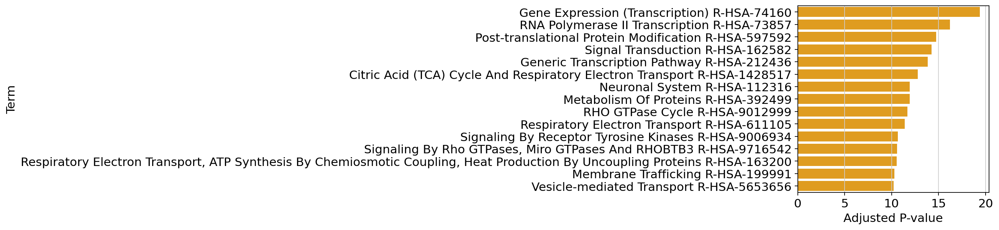

In [74]:
n_top = 15
sns.barplot(data=results.iloc[:n_top], x=-np.log10(results['Adjusted P-value']), y='Term', color='orange')

In [75]:
results.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSEA_Reactome_2022.csv')

## MGI_Mammalian_Phenotype_Level_4_2021

In [76]:
layer = 'L3'
genes_by_fc = edgeR_sign[layer].sort_values(by='logFC', ascending=False).index.tolist()

In [77]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/addList'
genes_str = '\n'.join(genes_by_fc)
description = 'L3 gene list'
payload = {
    'list': (None, genes_str),
    'description': (None, description)
}

response = requests.post(ENRICHR_URL, files=payload)
if not response.ok:
    raise Exception('Error analyzing gene list')

data = json.loads(response.text)
print(data)

{'shortId': 'd872dd6839b60a9300165ff8c3bfd0ae', 'userListId': 60475558}


In [78]:
import json
import requests


ENRICHR_URL = 'https://maayanlab.cloud/Enrichr/enrich'
query_string = '?userListId=%s&backgroundType=%s'
user_list_id = 60475266
gene_set_library = 'MGI_Mammalian_Phenotype_Level_4_2021'
response = requests.get(
    ENRICHR_URL + query_string % (user_list_id, gene_set_library)
 )
if not response.ok:
    raise Exception('Error fetching enrichment results')

data = json.loads(response.text)
print(data)

{'MGI_Mammalian_Phenotype_Level_4_2021': [[1, 'preweaning lethality, complete penetrance MP:0011100', 3.870527260752361e-37, 2.0106215906889315, 168.57505354358412, ['ATF2', 'PGAP1', 'SPI1', 'EHMT2', 'POP4', 'EHMT1', 'SCAMP5', 'KIAA1109', 'MPRIP', 'ALKBH1', 'FGFR1OP2', 'ANKFY1', 'DAXX', 'RBFOX1', 'CXADR', 'SECISBP2', 'ZNF281', 'DNTTIP1', 'FRS2', 'DICER1', 'MTHFD1', 'SPINT1', 'RUFY3', 'CDIP1', 'JTB', 'SLBP', 'SHMT2', 'CDCA5', 'MRPL12', 'LARP1', 'HLCS', 'FIGNL1', 'PIP5K1C', 'PSMF1', 'RSU1', 'ATG7', 'ATRIP', 'RHBDL1', 'B3GALNT2', 'JAG2', 'PRPF38B', 'JUP', 'ZNF260', 'NR2F1', 'PBX3', 'CS', 'MLLT10', 'COL1A2', 'VANGL2', 'ARF4', 'PIGU', 'PIGT', 'PIGO', 'PIGQ', 'PTH1R', 'OSBPL11', 'MRPL33', 'MED11', 'CHAF1B', 'TUBA1A', 'MED10', 'IKBKG', 'NELFA', 'SLC39A10', 'SRP9', 'MED28', 'MRPL44', 'MED23', 'PIGC', 'SLC7A5', 'MRPL51', 'CINP', 'MED20', 'RAPGEF1', 'PIGM', 'ZNF236', 'PIGF', 'PIGH', 'CRB2', 'TRUB2', 'ELOF1', 'SYNPO2', 'URM1', 'ATL2', 'ODC1', 'HTT', 'TMEM70', 'RECQL4', 'NRAS', 'TMEM67', 'LEO1', '

In [79]:
columns = ['Rank', 'Term', 'p-val', 'Z-score', 'Combined score', 'Overlapping genes', 'Adjusted P-value', 'Old p-value', 'Old adjusted p-value']
results = pd.DataFrame(data['MGI_Mammalian_Phenotype_Level_4_2021'], columns=columns)
results.Term = results.Term.astype(str)
results.set_index('Rank')
results.head(3)

,Rank,Term,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value
0,1,"preweaning lethality, complete penetrance MP:0...",3.870527e-37,2.010622,168.575054,"[ATF2, PGAP1, SPI1, EHMT2, POP4, EHMT1, SCAMP5...",1.762251e-33,0,0
1,2,hyperactivity MP:0001399,5.036470e-26,2.256490,131.441679,"[CYFIP2, ATF2, EHMT1, BACH2, PREX2, SCAMP5, GP...",1.146552e-22,0,0
2,3,decreased body weight MP:0001262,1.479196e-20,1.692945,77.300204,"[ATF2, MAML1, ITSN1, ARAF, SMC6, SMC3, SLC4A4,...",2.244926e-17,0,0


<Axes: xlabel='Adjusted P-value', ylabel='Term'>

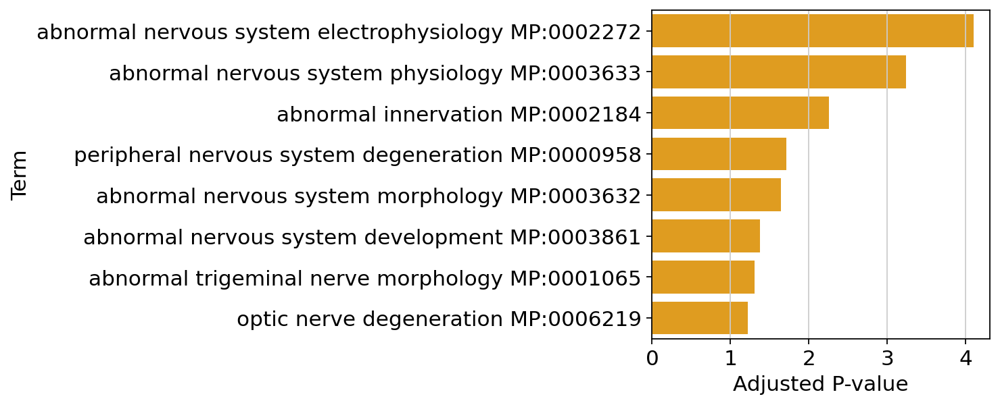

In [80]:
n_top = 8
sns.barplot(data=results[results.Term.str.contains('nerv')].iloc[:n_top], x=-np.log10(results['Adjusted P-value']), y='Term', color='orange')

In [81]:
results.to_csv(f'drive/MyDrive/Spatial project/results/Functional_analysis/pseudobulks/GSEA_MGI_Mammalian_Phenotype_Level_4_2021.csv')

# ssGSEA

In [85]:
df = pd.DataFrame(adata_pb.X.T, columns=adata_pb.obs_names, index=adata_pb.var_names)
df.head()

,WM.human_759,L5.human_759,L2.human_759,L3.human_759,L1.human_759,L6.human_759,L4.human_759,WM.human_j12,L3.human_j12,L4.human_j12,...,L2.151675,L4.151675,L6.151675,L3.151676,L1.151676,WM.151676,L6.151676,L5.151676,L2.151676,L4.151676
OR4F5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F16,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SAMD11,0.013550,0.022567,0.005142,0.007368,0.042370,0.018329,0.000000,0.037932,0.005477,0.005665,...,0.008627,0.000000,0.030031,0.017742,0.000000,0.052025,0.011722,0.010875,0.009573,0.027818
NOC2L,0.293452,0.356236,0.326878,0.337313,0.236571,0.360957,0.331772,0.401458,0.374840,0.431585,...,0.359916,0.390063,0.381798,0.382133,0.441931,0.387944,0.357932,0.331928,0.399161,0.416839


In [86]:
ss = gseapy.ssgsea(
    data=df,
    gene_sets='Azimuth_Cell_Types_2021',
    outdir=None,
    min_size=3,
    sample_norm_method="rank",
    no_plot=True
)
ssGSEA = ss.res2d

In [87]:
ssGSEA.head()

,WM.human_759,L5.human_759,L2.human_759,L3.human_759,L1.human_759,L6.human_759,L4.human_759,WM.human_j12,L3.human_j12,L4.human_j12,...,L2.151675,L4.151675,L6.151675,L3.151676,L1.151676,WM.151676,L6.151676,L5.151676,L2.151676,L4.151676
Term|NES,,,,,,,,,,,,,,,,,,,,,
AXL+ Dendritic Cell CL0000451,-0.031673,-0.014108,-0.014422,-0.017142,0.009611,-0.037833,-0.010277,0.019951,-0.006760,0.008216,...,0.031245,0.043405,0.029380,0.041117,0.020392,0.023344,0.022356,0.034392,0.008254,-0.003579
AXL+ Myeloid Dendritic Cell CL0000782,-0.036138,-0.010821,-0.020438,-0.021969,0.003837,-0.043325,-0.015449,0.015259,-0.003836,0.007455,...,0.056612,0.059094,0.043110,0.053598,0.055774,0.017567,0.042643,0.039813,0.048681,0.012272
AXL+ Plasmacytoid Dendritic Cell CL0000784,-0.144409,-0.129600,-0.146024,-0.143765,-0.173926,-0.156272,-0.125385,-0.144463,-0.104509,-0.087061,...,-0.121792,-0.145861,-0.220409,-0.133348,-0.152025,-0.214675,-0.186752,-0.143801,-0.156992,-0.206361
Acinar CL0002064,-0.363745,-0.429302,-0.432754,-0.454306,-0.429606,-0.415304,-0.433979,-0.436529,-0.460088,-0.445943,...,-0.431249,-0.421751,-0.431416,-0.429786,-0.369616,-0.435323,-0.404356,-0.434061,-0.427265,-0.426094
Activated Stellate CL0002410,0.170007,0.156997,0.147044,0.140589,0.351638,0.125112,0.120406,0.103373,-0.072410,-0.051907,...,0.180582,0.206394,0.273697,0.232364,0.311048,0.340940,0.283559,0.211560,0.219803,0.240151


In [92]:
ssGSEA.shape

(341, 111)

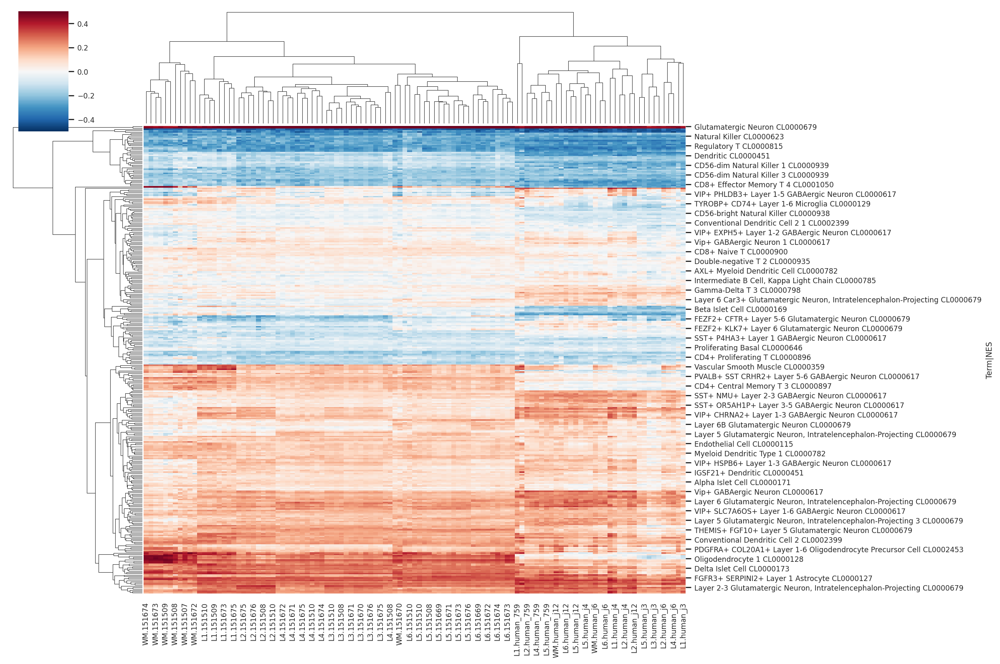

In [99]:
sns.set(font_scale=0.7)
sns.clustermap(ssGSEA, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize=(15, 10), method="average", annot_kws={"size": 2})

Профили очень похожи

In [107]:
human_young_samples = ssGSEA.columns[ssGSEA.columns.str.contains('human')]
human_old_samples = ssGSEA.columns[~ssGSEA.columns.str.contains('human')]

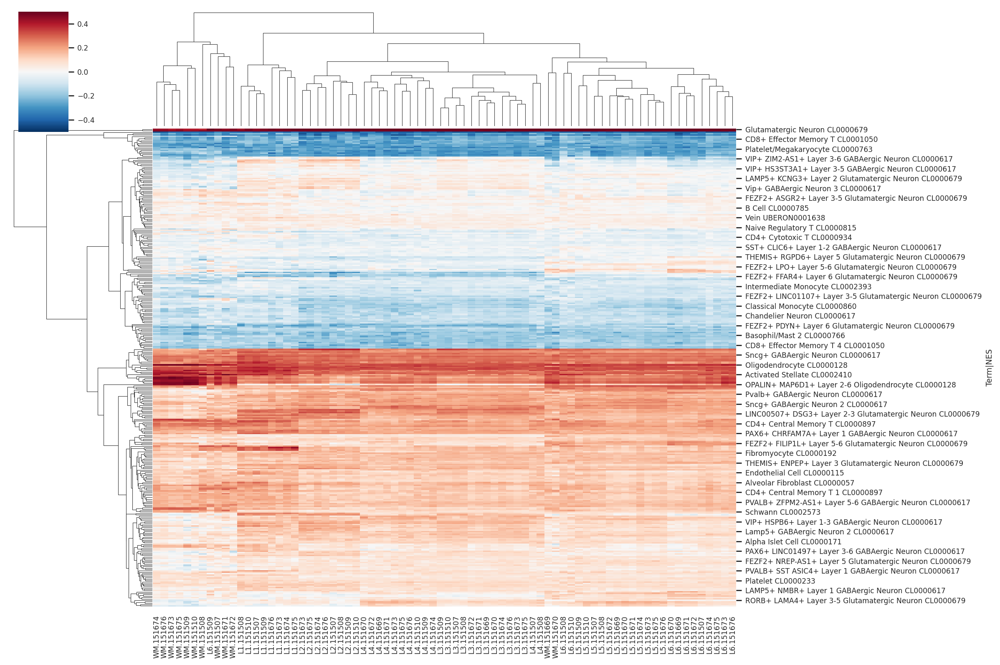

In [108]:
sns.clustermap(ssGSEA[human_old_samples], cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize=(15, 10), method="average", annot_kws={"size": 2})

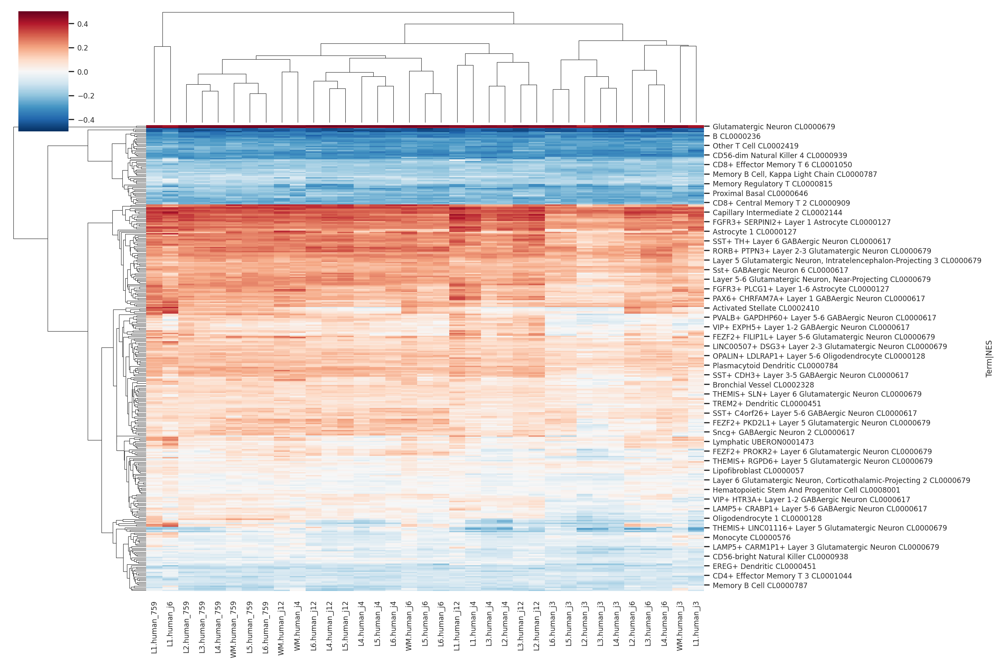

In [109]:
sns.clustermap(ssGSEA[human_young_samples], cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize=(15, 10), method="average", annot_kws={"size": 2})

In [121]:
adata_ssgsea = an.AnnData(ssGSEA.T, obs=adata_pb.obs)
adata_ssgsea

AnnData object with n_obs × n_vars = 111 × 341
    obs: 'layer', 'sample_id', 'condition', 'label'

In [122]:
sc.pp.pca(adata_ssgsea)

computing PCA
    with n_comps=50
    finished (0:00:00)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


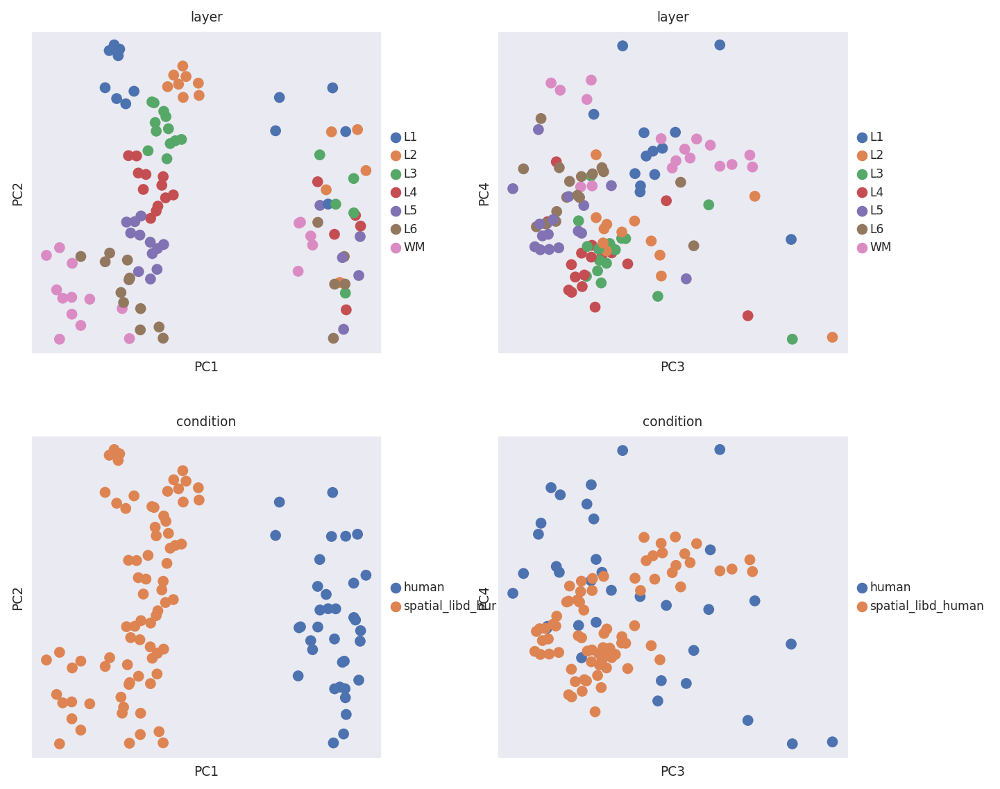

In [123]:
sc.pl.pca(adata_ssgsea, color=['layer', 'condition'], size=200, ncols=2, components = ['1,2','3,4'])

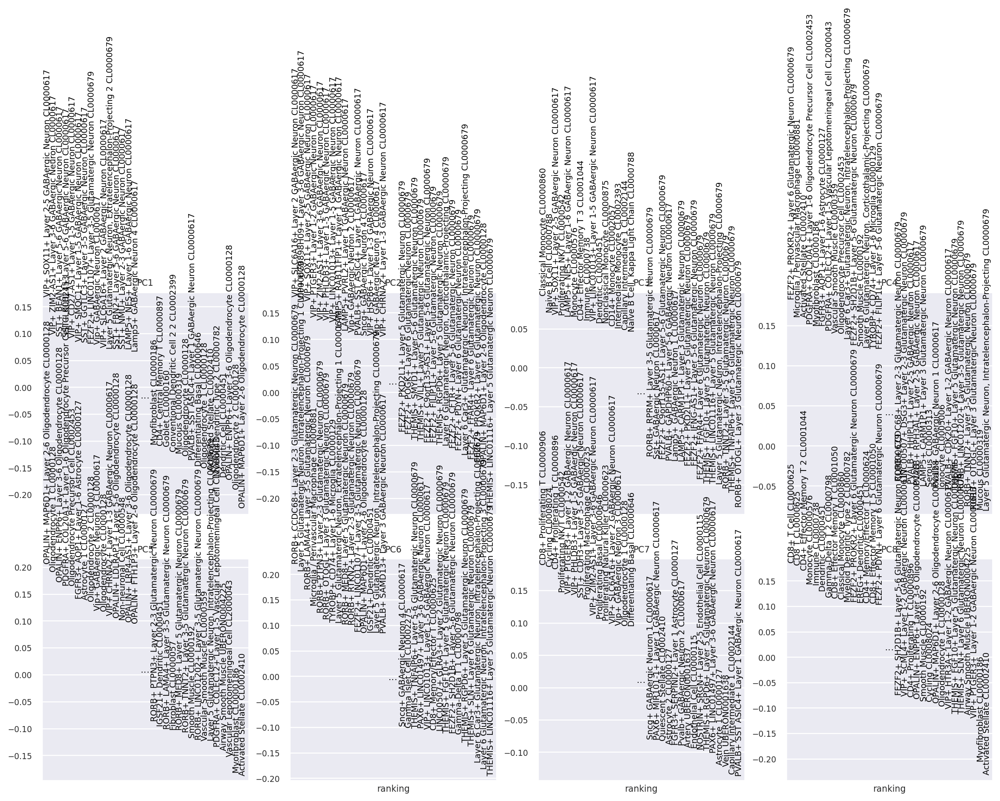

In [124]:
sc.pl.pca_loadings(adata_ssgsea, components=[1,2,3,4,5,6,7,8])